In [ ]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install ultralytics
from ultralytics import YOLO

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 901.3/901.3 kB 15.7 MB/s eta 0:00:00a 0:00:01
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


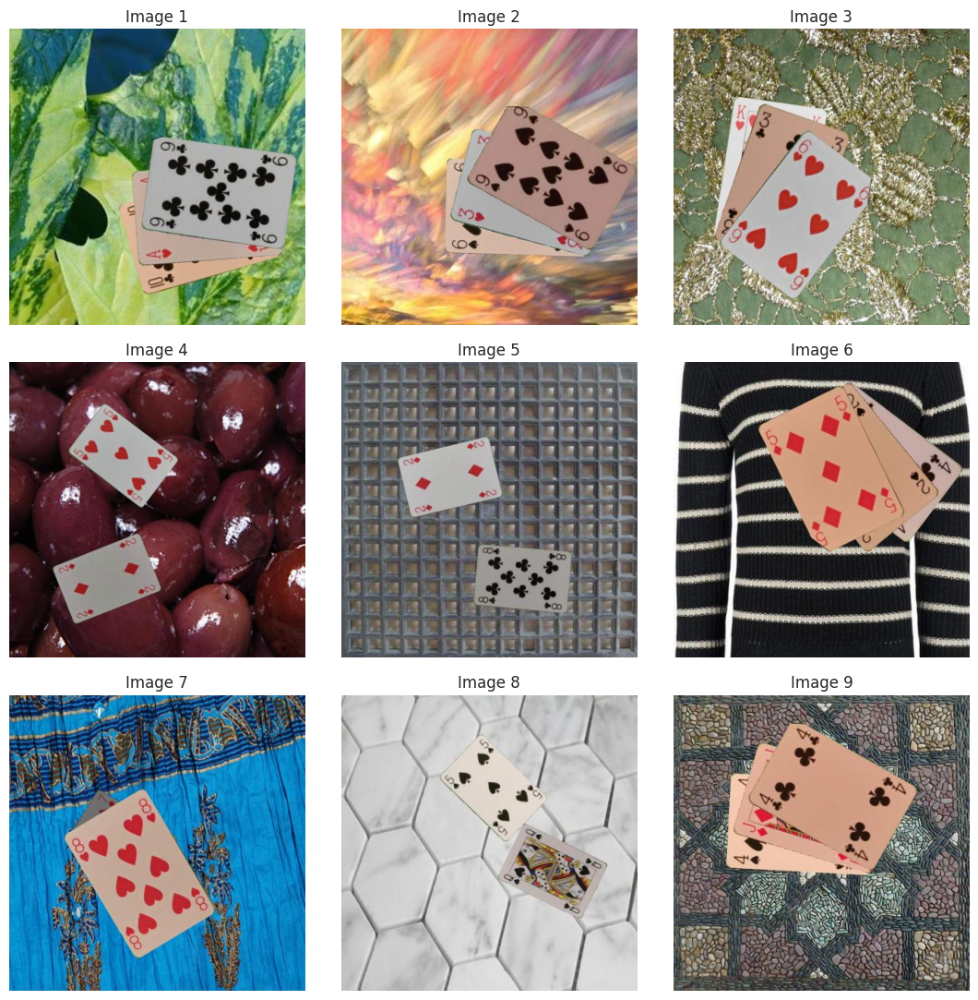

In [ ]:
training_images_dir = '/kaggle/input/playing-cards-object-detection-dataset/train/images'
num_samples = 9
image_files = os.listdir(training_images_dir)
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(training_images_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
for image in rand_images:
    img_path = os.path.join(training_images_dir, image)
    img = plt.imread(img_path)
    print(f"{image}: {img.shape}")

462983250_jpg.rf.02cf836861267ae8f7f1ad47a0196bd0.jpg: (416, 416, 3)
985986217_jpg.rf.0247eef14a24115854c0ba61e451a69b.jpg: (416, 416, 3)
866122652_jpg.rf.c2bb990f2c2aa651f57648f58428b15f.jpg: (416, 416, 3)
942276770_jpg.rf.282111a5d518fe96ed389655b0b6c451.jpg: (416, 416, 3)
689504474_jpg.rf.b270df2d382e0ef40d50d13f3b89afcf.jpg: (416, 416, 3)
249041967_jpg.rf.26496e2fbbb30fb776585b3b38a84fd2.jpg: (416, 416, 3)
011951597_jpg.rf.a8af6b65c27429b43dce5cd19225f7be.jpg: (416, 416, 3)
111214844_jpg.rf.54da7d5120bbe6872e95ffc224fe610c.jpg: (416, 416, 3)
782192456_jpg.rf.f714e9f332b312f001a2c0c6dae4ffc1.jpg: (416, 416, 3)


In [ ]:
model = YOLO("yolov8n.pt")

100%|██████████| 6.25M/6.25M [00:00<00:00, 79.8MB/s]



image 1/1 /kaggle/input/playing-cards-object-detection-dataset/train/images/000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg: 416x416 1 bed, 7.0ms
Speed: 8.2ms preprocess, 7.0ms inference, 424.1ms postprocess per image at shape (1, 3, 416, 416)


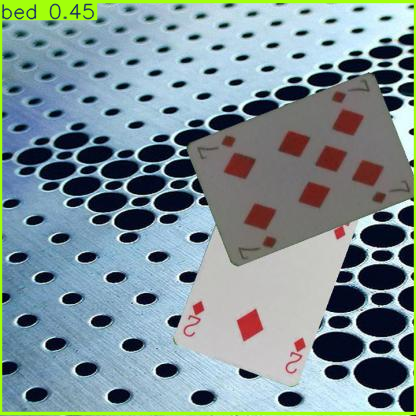

In [ ]:
image = os.path.join(training_images_dir, '000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg')
result_predict = model.predict(source = image, imgsz=(416))

plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


image 1/1 /kaggle/input/playing-cards-object-detection-dataset/train/images/000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg: 416x416 1 bed, 8.1ms
Speed: 1.1ms preprocess, 8.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


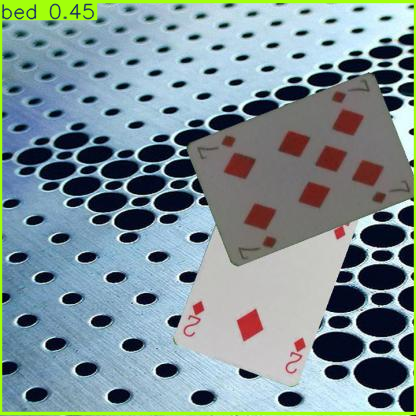

In [ ]:
image = os.path.join(training_images_dir, '000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg')
result_predict = model.predict(source = image, imgsz=(416))


plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [ ]:
!pip install --upgrade ultralytics ray

In [ ]:
Final_model = YOLO('yolov8n.pt')
result_final_model = Final_model.train(data="/kaggle/input/playing-cards-object-detection-dataset/kaggle_data.yaml",
                                       epochs=30, batch=-1, optimizer='auto')

Ultralytics 8.3.51 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/playing-cards-object-detection-dataset/kaggle_data.yaml, epochs=30, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

100%|██████████| 755k/755k [00:00<00:00, 17.0MB/s]


Overriding model.yaml nc=80 with nc=52

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 70.0MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/playing-cards-object-detection-dataset/train/labels... 14000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14000/14000 [01:34<00:00, 147.46it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/playing-cards-object-detection-dataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.11G reserved, 0.08G allocated, 14.55G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     3020988       8.249         0.199         87.49         290.1        (1, 3, 640, 640)                    list
     3020988        16.5         0.308         23.58         57.75        (2, 3, 640, 640)                    list
     3020988          33         0.556         25.26         47.67        (4, 3, 640, 640)                    list
     3020988       65.99

train: Scanning /kaggle/input/playing-cards-object-detection-dataset/train/labels... 14000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 14000/14000 [00:29<00:00, 477.54it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/playing-cards-object-detection-dataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/playing-cards-object-detection-dataset/valid/labels... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:26<00:00, 149.02it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/playing-cards-object-detection-dataset/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0008203125), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      14.2G       1.35      5.051      1.056        156        640: 100%|██████████| 134/134 [02:43<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:29<00:00,  1.47s/it]


                   all       4000      15159     0.0118      0.881     0.0192     0.0158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      14.1G     0.8702      3.397     0.8759        204        640: 100%|██████████| 134/134 [02:33<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:27<00:00,  1.36s/it]


                   all       4000      15159      0.156      0.408      0.173      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      14.1G     0.7579      2.452     0.8608        175        640: 100%|██████████| 134/134 [02:34<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:27<00:00,  1.36s/it]


                   all       4000      15159      0.428      0.647      0.514      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      14.1G     0.6967      1.848     0.8488        147        640: 100%|██████████| 134/134 [02:34<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:27<00:00,  1.36s/it]


                   all       4000      15159      0.642      0.771      0.769      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      14.1G     0.6604       1.47     0.8411        210        640: 100%|██████████| 134/134 [02:35<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.34s/it]


                   all       4000      15159      0.773      0.837      0.871      0.766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      14.1G     0.6305      1.275     0.8375        192        640: 100%|██████████| 134/134 [02:35<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


                   all       4000      15159      0.785      0.887      0.892      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      14.1G     0.6078      1.135     0.8351        204        640: 100%|██████████| 134/134 [02:33<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.33s/it]


                   all       4000      15159      0.843      0.873      0.921       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      14.1G     0.5892      1.033     0.8311        204        640: 100%|██████████| 134/134 [02:34<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


                   all       4000      15159      0.857      0.908      0.938      0.839

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      14.1G     0.5776     0.9496     0.8293        180        640: 100%|██████████| 134/134 [02:35<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.34s/it]


                   all       4000      15159      0.885      0.936      0.955      0.861

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      14.1G     0.5647     0.8933     0.8284        206        640: 100%|██████████| 134/134 [02:33<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.33s/it]


                   all       4000      15159      0.903      0.946      0.961      0.871

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      14.1G     0.5552     0.8346     0.8256        179        640: 100%|██████████| 134/134 [02:35<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


                   all       4000      15159       0.91      0.951      0.963      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      14.1G     0.5463     0.7978     0.8242        171        640: 100%|██████████| 134/134 [02:34<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


                   all       4000      15159      0.918      0.945      0.967      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      14.1G     0.5396     0.7689     0.8221        192        640: 100%|██████████| 134/134 [02:33<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.34s/it]


                   all       4000      15159      0.931      0.959      0.973      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      14.1G     0.5397     0.7432     0.8231        156        640: 100%|██████████| 134/134 [02:34<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


                   all       4000      15159      0.934      0.965      0.973      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      14.1G     0.5272     0.7157     0.8222        203        640: 100%|██████████| 134/134 [02:34<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


                   all       4000      15159      0.938      0.959      0.975      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      14.1G     0.5261     0.6901     0.8221        170        640: 100%|██████████| 134/134 [02:31<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]


                   all       4000      15159      0.932      0.967      0.973      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      14.1G     0.5169     0.6751     0.8187        147        640: 100%|██████████| 134/134 [02:31<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


                   all       4000      15159      0.944      0.963      0.977      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      14.1G     0.5116      0.659     0.8181        187        640: 100%|██████████| 134/134 [02:32<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.32s/it]

                   all       4000      15159      0.942      0.973      0.976      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      14.1G     0.5055     0.6376      0.817        178        640: 100%|██████████| 134/134 [02:30<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


                   all       4000      15159      0.947      0.977       0.98      0.903

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      14.1G     0.5025     0.6251     0.8154        201        640: 100%|██████████| 134/134 [02:32<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


                   all       4000      15159      0.953      0.974      0.981      0.901
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      13.8G     0.4549     0.5256     0.8079        126        640: 100%|██████████| 134/134 [02:29<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.30s/it]


                   all       4000      15159      0.944      0.973      0.978      0.893

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      13.8G     0.4396     0.5019     0.8041        125        640: 100%|██████████| 134/134 [02:23<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.30s/it]


                   all       4000      15159      0.953      0.966      0.981      0.895

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      13.8G     0.4336     0.4874     0.8039        135        640: 100%|██████████| 134/134 [02:25<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.33s/it]

                   all       4000      15159      0.944      0.975      0.978        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      13.8G     0.4293      0.476      0.804        126        640: 100%|██████████| 134/134 [02:24<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.30s/it]


                   all       4000      15159      0.943      0.985       0.98      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      13.8G     0.4245     0.4663     0.8029        131        640: 100%|██████████| 134/134 [02:24<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.30s/it]

                   all       4000      15159      0.949      0.976      0.982      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      13.8G     0.4214     0.4588     0.8014        131        640: 100%|██████████| 134/134 [02:24<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.30s/it]


                   all       4000      15159      0.948      0.978      0.982      0.909

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      13.8G     0.4175     0.4494     0.8009        127        640: 100%|██████████| 134/134 [02:24<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


                   all       4000      15159       0.95      0.977      0.981      0.907

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      13.8G     0.4143     0.4448     0.8007        127        640: 100%|██████████| 134/134 [02:23<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


                   all       4000      15159      0.954      0.979      0.983      0.908

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      13.8G     0.4126     0.4392     0.7998        129        640: 100%|██████████| 134/134 [02:24<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:26<00:00,  1.31s/it]


                   all       4000      15159      0.952      0.977      0.982       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      13.8G     0.4091     0.4348     0.7994        129        640: 100%|██████████| 134/134 [02:23<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.30s/it]


                   all       4000      15159      0.957      0.977      0.983      0.911

30 epochs completed in 1.491 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.51 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,015,788 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:31<00:00,  1.59s/it]


                   all       4000      15159      0.957      0.977      0.983       0.91
                   10c        180        282      0.976      0.991      0.995      0.881
                   10d        188        290      0.986      0.988      0.995      0.878
                   10h        201        322      0.972      0.991      0.994      0.874
                   10s        165        250      0.991      0.996      0.995      0.869
                    2c        193        295      0.986      0.993      0.995      0.929
                    2d        167        259      0.979      0.996      0.995      0.928
                    2h        187        294      0.987      0.997      0.995      0.926
                    2s        192        299      0.997       0.99      0.995      0.928
                    3c        201        308      0.994      0.998      0.994      0.944
                    3d        167        250      0.988      0.994      0.995      0.928
                    3

In [ ]:
def display_images(post_training_files_path, image_files):
    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(20, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [ ]:
Valid_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')


metrics = Valid_model.val(split = 'val')


print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.51 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,015,788 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/playing-cards-object-detection-dataset/valid/labels... 4000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4000/4000 [00:08<00:00, 458.59it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/playing-cards-object-detection-dataset/valid is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 250/250 [00:35<00:00,  6.97it/s]


                   all       4000      15159      0.957      0.977      0.983      0.914
                   10c        180        282      0.976      0.992      0.995      0.882
                   10d        188        290      0.986      0.988      0.995      0.873
                   10h        201        322      0.972      0.991      0.994      0.874
                   10s        165        250      0.991      0.996      0.995      0.873
                    2c        193        295      0.986      0.993      0.995      0.934
                    2d        167        259       0.98      0.996      0.995      0.933
                    2h        187        294      0.987      0.997      0.995      0.927
                    2s        192        299      0.997       0.99      0.995      0.928
                    3c        201        308      0.994      0.998      0.994       0.95
                    3d        167        250      0.988      0.994      0.995      0.934
                    3

In [ ]:
dataset_path = '/kaggle/input/playing-cards-object-detection-dataset'
test_images_path = os.path.join(dataset_path, 'test', 'images')


image_files = [file for file in os.listdir(test_images_path) if file.endswith('.jpg')]


0: 640x640 1 4h, 2 7ss, 1 Js, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 5s, 2 6ss, 7.5ms
Speed: 2.1ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 2d, 1 9s, 2 Jss, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 4d, 2 5ds, 1 9s, 7.5ms
Speed: 2.0ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 5h, 1 8c, 2 Acs, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3h, 2 4ss, 1 9c, 7.5ms
Speed: 2.1ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 4d, 2 5cs, 1 Kh, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 9ds, 2 Acs, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1

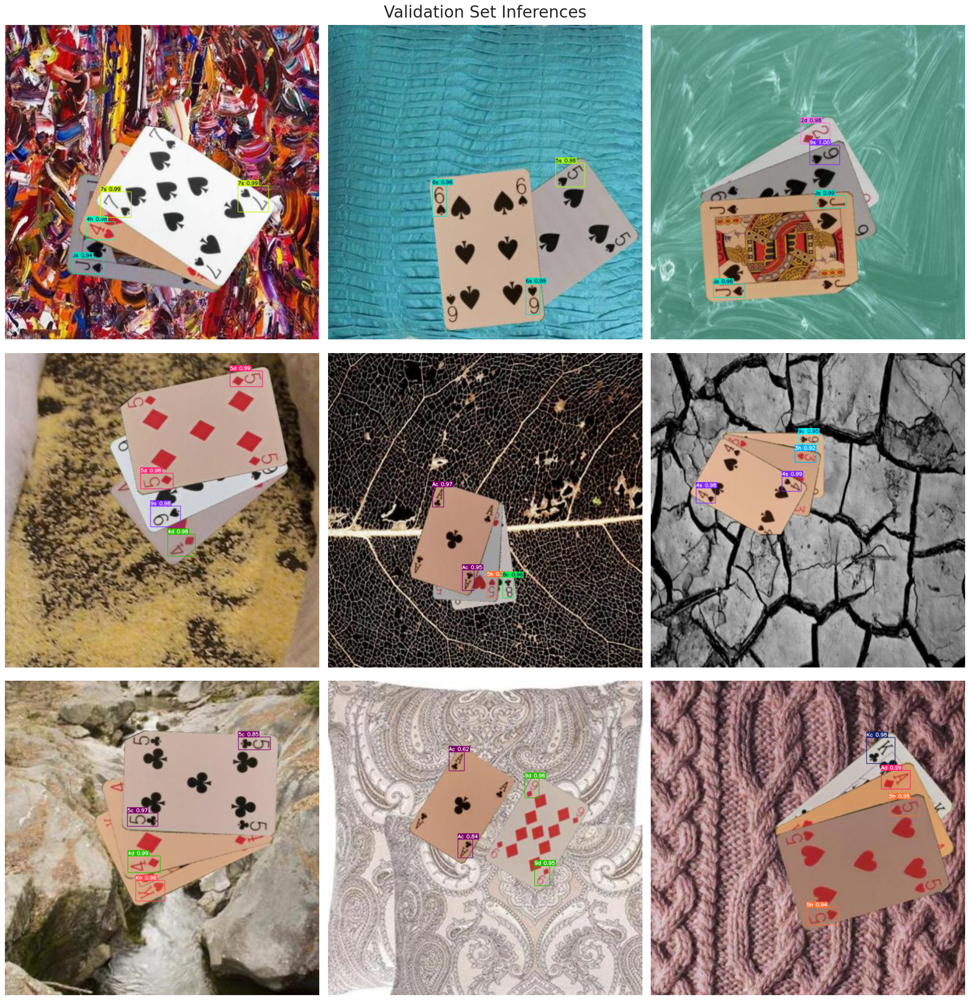

In [ ]:
if len(image_files) > 0:
    num_images = len(image_files)
    step_size = max(1, num_images // 9)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)


    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(test_images_path, selected_images[i])
            image = cv2.imread(image_path)
            if image is not None:
                resized_image = cv2.resize(image, (640, 640))
                normalized_image = resized_image / 255.0
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                results = Final_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()



0: 640x640 1 2d, 2 7ds, 7.5ms
Speed: 2.4ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


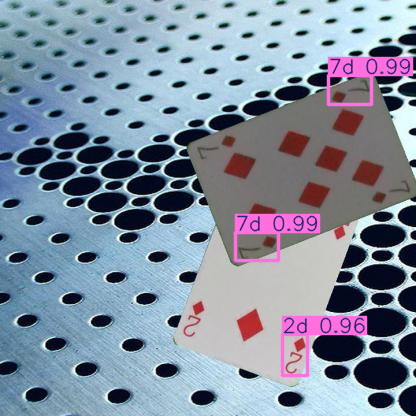

In [ ]:
image_path = os.path.join(training_images_dir, '000958849_jpg.rf.080b6270c4d4ff260774c0bf5c780f44.jpg')
image = cv2.imread(image_path)

resized_image = cv2.resize(image, (640, 640))
normalized_image = resized_image / 255.0

result_predict = Valid_model.predict(source = image, imgsz=(640), conf=0.5)

plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))